# Multiome pilot QC 

This is a series of visualisations part of the team Wood multiome pilot data (55 samples) QC. This includes visualisation of RNA metrics, ATAC metrics and selection of filtration thresholds for downstream steps. 
Overall the data is high quality, with evidence of low citoplasmic contamination. The current selection of filtration threshold is more stringent for ATAC (loss of 20% of nuclei) than RNA (loss of 10% of nuclei). The intersection of nuclei satisfying both RNA and ATAC thresholds is 71%. 

Batches to highlight: 
The batch with lowest quality was 16, in particular this contained two samples from an individual with low quality RNA (see below). 

Samples to highlight:
The sample with lowest quality was PD0969 - the Parietal sample of this individual had already been excluded, but for Cingulate and Frontal the parameters for both PD and ATAC indicated low quality. The RIN for this brain ranged between 1.8-2.2, indicating low quality in the first place. **Should this sample be excluded?** 

The ATAC data had more evidence of a lower signal-to-noise ratio, although this may be due to the sparsity inherent of ATAC data. 

References used for visualisation and threshold selection in this QC:  
 - https://www.sc-best-practices.org/
 - http://bioconductor.org/books/3.13/OSCA.advanced/quality-control-redux.html

In [1]:
###---------------------load libraries

import muon
import scanpy as sc
import math
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import copy
import scipy.stats

In [3]:
###---------------------Plotting functions
    
def scatter(adata, var1, var2, hue):
    c=math.ceil(len(adata.obs['Group'].unique()))
    r=math.ceil(len(adata.obs['region'].unique()))
    l=0

    fig, axes = plt.subplots(r,c, figsize=(5*c, 5*r))
    plt.subplots_adjust(wspace=0.35, hspace=0.35)

    for m in range(0,r):
        for n in range(0,c):
            s = adata[adata.obs['region']==(adata.obs['region'].unique()[m])]
            t = s[s.obs['Group']==(s.obs['Group'].unique()[n])]
            
            #print(s.obs['Group'].unique()[n])
            #print(adata.obs['region'].unique()[m])
            g = sns.scatterplot(ax=axes[m,n], x=t.obs[var1], y=t.obs[var2], hue = adata.obs[hue])
            axes[m,n].set_title(adata.obs['Group'].unique()[n]+' - '+adata.obs['region'].unique()[m])
    #plt.savefig('allsamples_%s_%s_%s_%s.pdf' % (xparam0, xparam1, xparam2, xparam3), bbox_inches='tight')
    plt.show()
    
def violin_region_x_groups(adata, xparam0, thr0, lim):
    print('###--------------------------------------------------------------------------', xparam0, '--------------------------------------------------------------------------###')
    c=math.ceil(len(adata.obs['Group'].unique()))
    r=math.ceil(len(adata.obs['region'].unique()))
    l=0

    fig, axes = plt.subplots(r,c, figsize=(5*c, 5*r))
    plt.subplots_adjust(wspace=0.35, hspace=0.35)

    for m in range(0,r):
        for n in range(0,c):
            s = adata[adata.obs['region']==(adata.obs['region'].unique()[m])]
            t = s[s.obs['Group']==(s.obs['Group'].unique()[n])]
            if n==0:
                cl='indianred'
            if n==1:
                cl='skyblue'
            if n==2:
                cl='gold'
            
            g = sns.violinplot(ax=axes[m,n], y=t.obs[xparam0], color = cl)
            g.set(ylim=(None, lim))
            g.axhline(thr0)
            axes[m,n].set_title(adata.obs['Group'].unique()[n]+' - '+adata.obs['region'].unique()[m])
    #plt.savefig('allsamples_%s_%s_%s_%s.pdf' % (xparam0, xparam1, xparam2, xparam3), bbox_inches='tight')
    plt.show()

def boxplot_plotting(adata, param0, thr0):
    sns.set(font_scale=6)
    r=math.ceil(len(adata.obs['sample_id'].unique()))
    sns.set(rc={'figure.figsize':(r/10,r)})
    g = sns.boxplot(x=adata.obs[param0], y=adata.obs['sample_id'])
    g.axvline(thr0)
    #plt.savefig('boxplot_allsamples_%s.pdf' % param, bbox_inches = 'tight')
    plt.show()

## Load data

In [4]:
###---------------------Load data

madata = muon.read("annotated_multiome_pilot_unfilt.h5mu")
batches = pd.read_csv('Wood_batches_pilot.csv')

In [5]:
madata['rna'].obs.reset_index(inplace = True)
madata['rna'].obs = madata['rna'].obs.merge(batches, left_on = 'sample_id', right_on = 'sample_id', how = 'left')
madata['rna'].obs.set_index('index', inplace = True)

/camp/lab/gandhis/home/users/grantpm/.conda/envs/panpipes/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


# Overview of each batch
The total nuclei ranged from ~3,000 to 20,000 per individual. It was clear that batches had an effect on the total nuclei yield, with batch 12 having many more nuclei than e.g. batch 1. As to QC metrics, each batch was quite variable, albeit within an acceptable range. Batch 16 had higher mitochondrial content and lower total counts, suggesting this may be a lower quality batch.

In [6]:
adata = madata['rna']

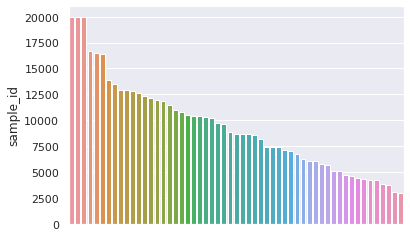

In [7]:
sns.set(rc={'figure.figsize':(10,8)})

g = sns.barplot(data=adata.obs['sample_id'].value_counts().to_frame(), x=adata.obs['sample_id'].value_counts().to_frame().index, y='sample_id')
g.set(label=None)
g.set(xticklabels=[])
plt.show()

In [8]:
summary = adata.obs['sample_id'].value_counts().to_frame().rename(columns = {'sample_id' : 'counts'})
summary = summary.merge(batches, left_index = True, right_on='sample_id', how = 'left').set_index('sample_id')

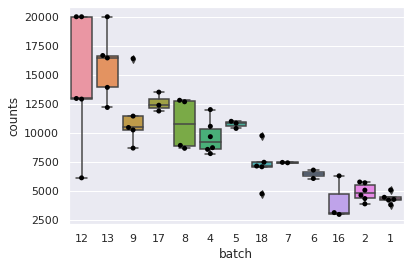

In [9]:
g = sns.boxplot(data=summary, x='batch', y='counts')
g = sns.swarmplot(data=summary, x='batch', y='counts', color = 'black')
g.set(label=None)
plt.show()

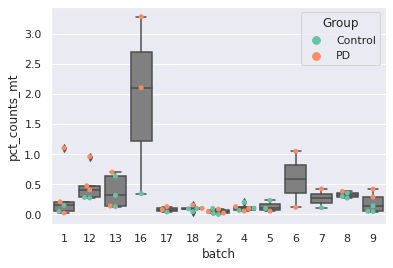

In [10]:
summary = adata.obs.groupby(['sample_id', 'batch', 'Group']).median().reset_index()

g = sns.boxplot(data=summary, x='batch', y='pct_counts_mt', color = 'grey')
g = sns.swarmplot(data=summary, x='batch', y='pct_counts_mt', hue = 'Group', palette = 'Set2')
g.set(label=None)
plt.show()


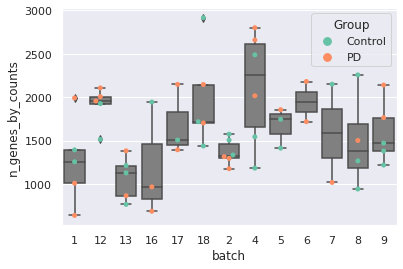

In [11]:
g = sns.boxplot(data=summary, x='batch', y='n_genes_by_counts', color = 'grey')
g = sns.swarmplot(data=summary, x='batch', y='n_genes_by_counts', hue = 'Group', palette = 'Set2')
g.set(label=None)
plt.show()


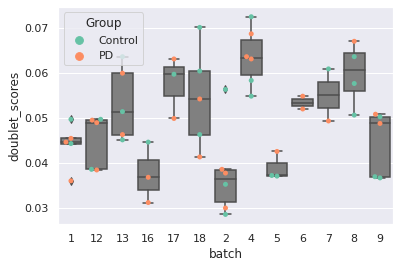

In [11]:
g = sns.boxplot(data=summary, x='batch', y='doublet_scores', color = 'grey')
g = sns.swarmplot(data=summary, x='batch', y='doublet_scores', hue = 'Group', palette = 'Set2')
g.set(label=None)
plt.show()

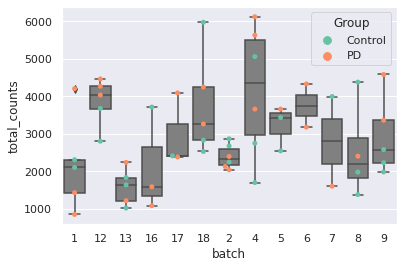

In [12]:
g = sns.boxplot(data=summary, x='batch', y='total_counts', color = 'grey')
g = sns.swarmplot(data=summary, x='batch', y='total_counts', hue = 'Group', palette = 'Set2')
g.set(label=None)
plt.show()


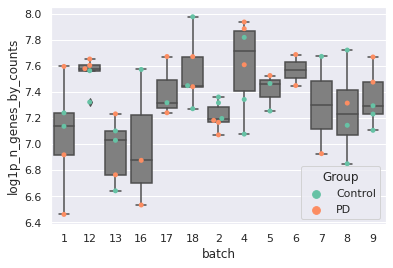

In [13]:
g = sns.boxplot(data=summary, x='batch', y='log1p_n_genes_by_counts', color = 'grey')
g = sns.swarmplot(data=summary, x='batch', y='log1p_n_genes_by_counts', hue = 'Group', palette = 'Set2')
g.set(label=None)
plt.show()

# 1.0 RNA metrics 
### 1.1 Doublet scores
Using scrublet, we determined the doublet scores. A stringent cutoff of 0.12 seems to be appropriate based on the boxplots, but this excludes a large number of nuclei, so I am opting for a more lenient threshold of 0.15 which excludes approximately 40,000 nuclei (~8% of nuclei). The doublet scores are being kept for downstream steps, so that this can be taken into account during clustering annotation. 

###-------------------------------------------------------------------------- doublet_scores --------------------------------------------------------------------------###


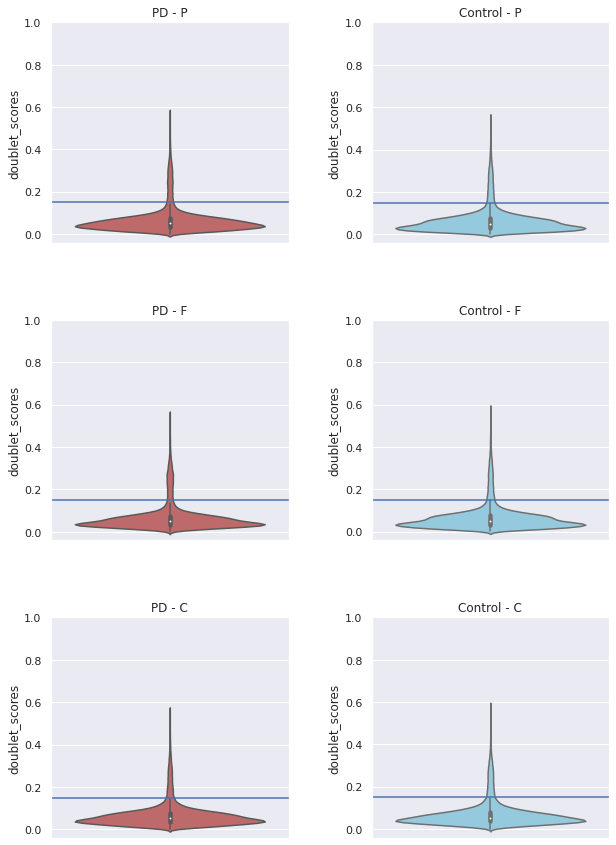

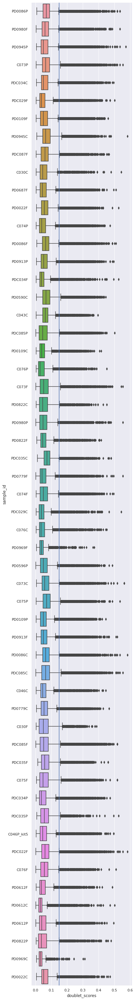

In [14]:
violin_region_x_groups(adata = madata['rna'], xparam0 = 'doublet_scores', thr0 = 0.15, lim = 1)

boxplot_plotting(adata = adata, param0 = 'doublet_scores', thr0 = 0.15)

### 1.2 Mitochondrial Content

The mitochondrial content is generally low for these samples, with most samples having a mean well below 5% which is generally a gold standard threshold for brain postmortem samples. One sample, PD0969, had higher mitochondrial content for two regions (control and frontal). Given that this sample had a lower yield to start with, it may indicate an issue with isolation/sequencing or simply that nuclei in these samples are more damaged as a result of disease. 

###-------------------------------------------------------------------------- pct_counts_mt --------------------------------------------------------------------------###


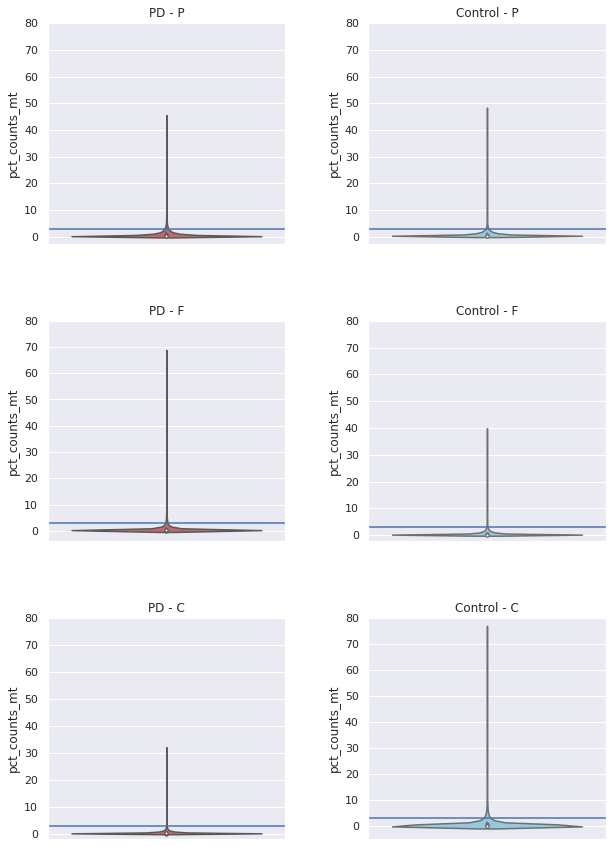

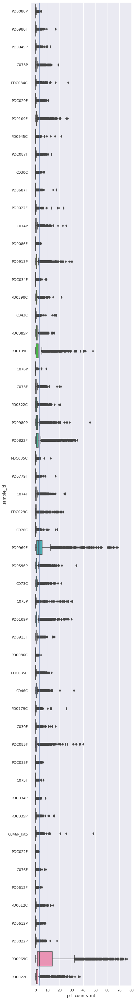

In [15]:
violin_region_x_groups(adata = adata,xparam0 = 'pct_counts_mt', thr0 = 3, lim = 80)

boxplot_plotting(adata = adata, param0 ='pct_counts_mt', thr0 = 3)

### 1.3 Ribosomal content

The ribosomal content for these samples was generally low, indicating again lower levels of contamination. 

###-------------------------------------------------------------------------- pct_counts_rp --------------------------------------------------------------------------###


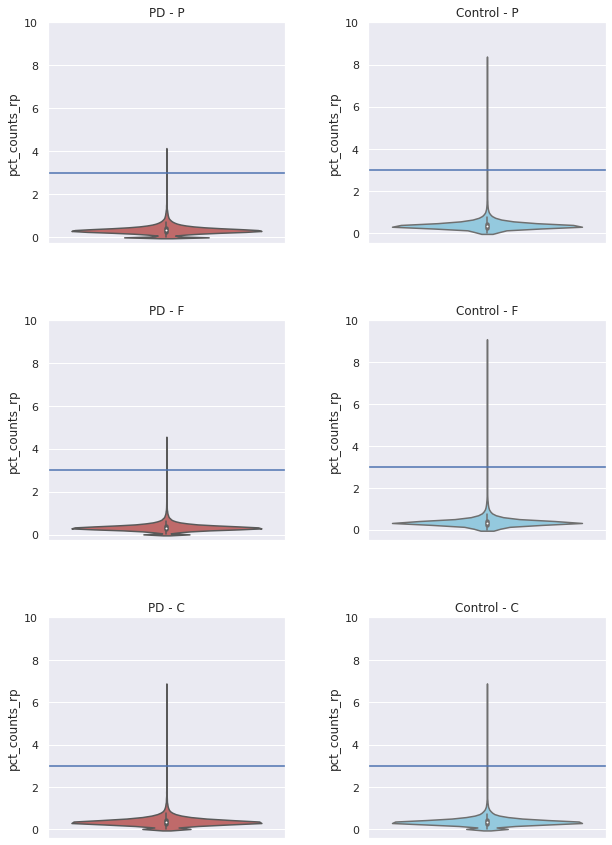

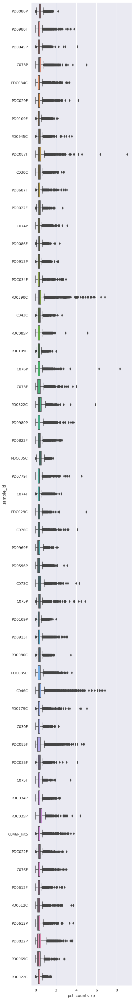

In [16]:
violin_region_x_groups(adata = madata['rna'],xparam0 = 'pct_counts_rp', thr0 = 3, lim = 10)

boxplot_plotting(adata, param0 = 'pct_counts_rp', thr0 = 2)

### 1.4 Haemoglobin

Since erythrocytes do not have nuclei, we do not expect to have high expressions of haemoglobin. Hb expression is, therefore, generally associated with contamination along with rp and mt rna. These were low (mean 0.0%) and only high for 2-3 nuclei in total. 

###-------------------------------------------------------------------------- pct_counts_hb --------------------------------------------------------------------------###


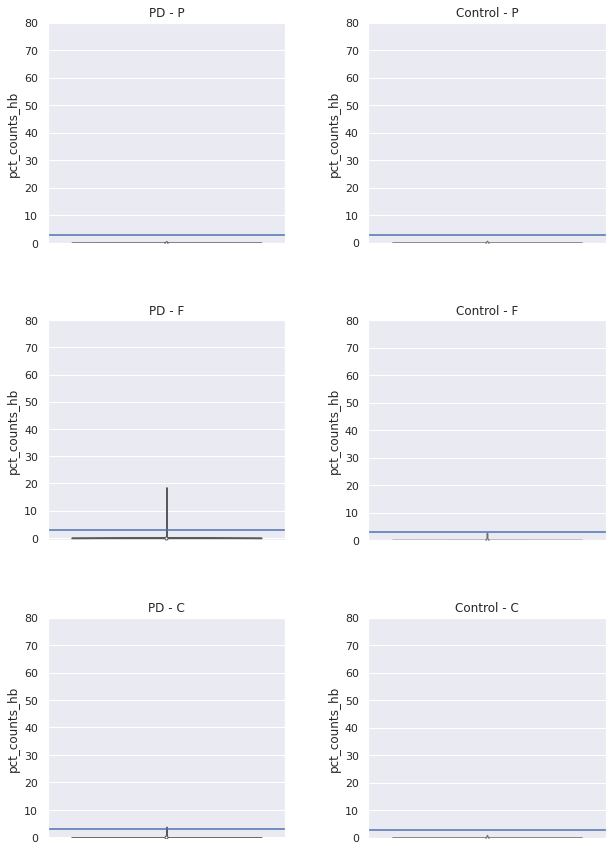

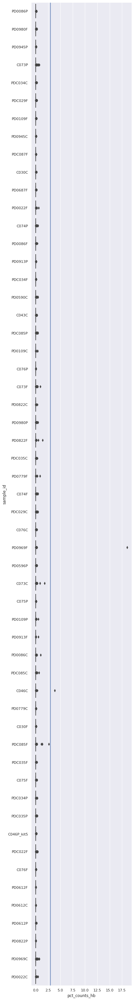

In [17]:
violin_region_x_groups(adata = madata['rna'],xparam0 = 'pct_counts_hb', thr0 = 3, lim = 80)

boxplot_plotting(adata, 'pct_counts_hb', 3)

### 1.5 Total counts

Total counts can be used as a metric to identify barcodes which likely contain two or more cells, so outlyers may be excluded in certain circumstances. However, higher transcriptional rates are also expected in certain circumstances (e.g. disease), so I am considering this in the context of the doublet scores. 

###-------------------------------------------------------------------------- n_genes_by_counts --------------------------------------------------------------------------###


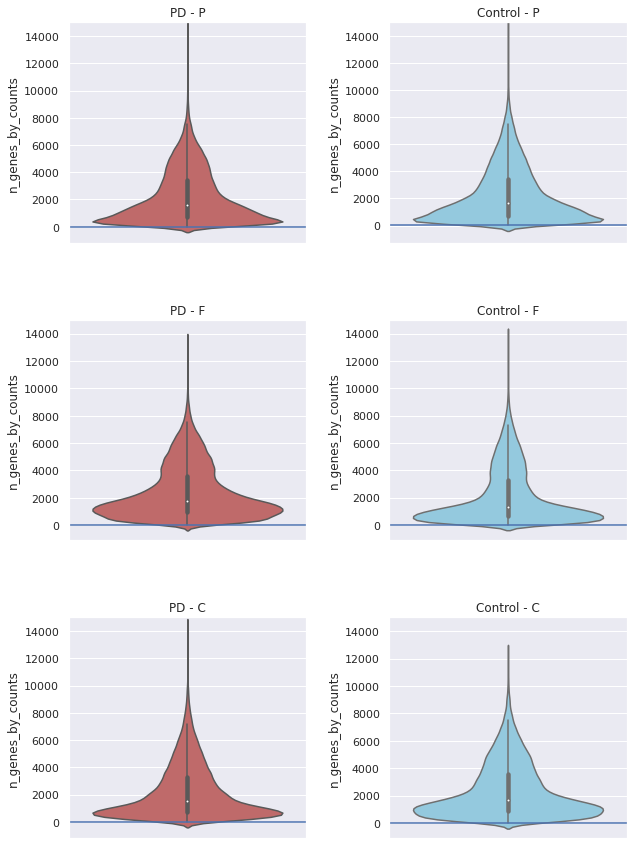

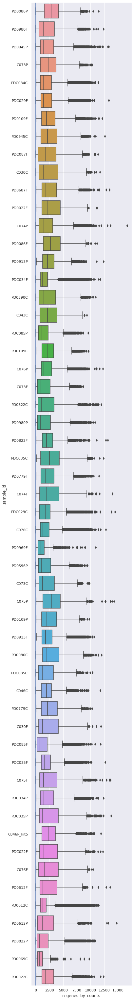

In [14]:
violin_region_x_groups(adata = madata['rna'],xparam0 = 'n_genes_by_counts', thr0 = 3, lim = 15000)

boxplot_plotting(adata, 'n_genes_by_counts', 3)

###-------------------------------------------------------------------------- total_counts --------------------------------------------------------------------------###


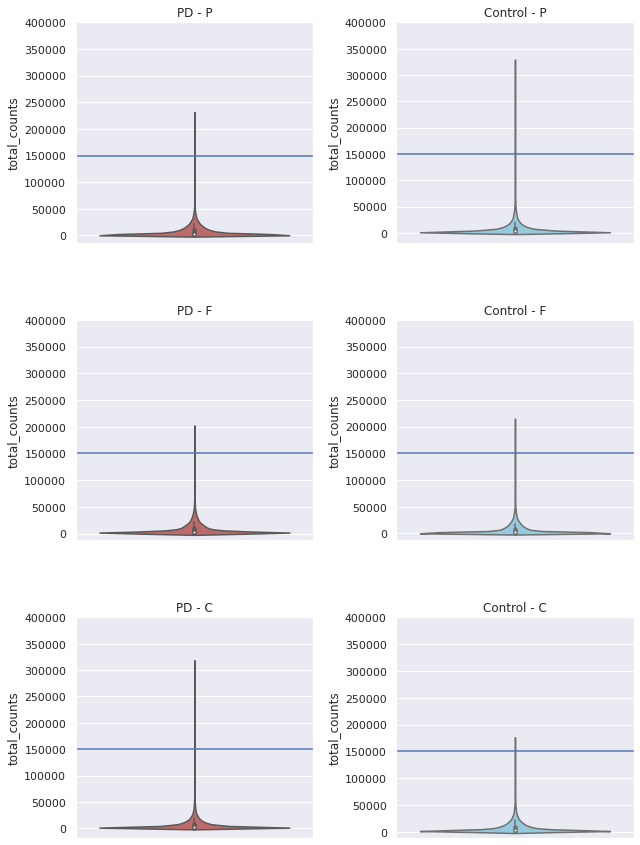

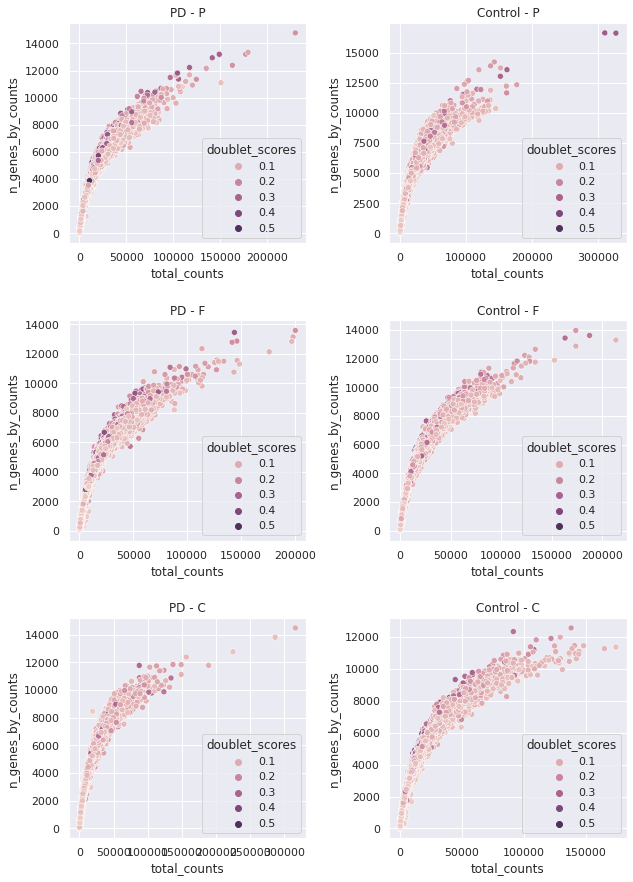

In [18]:
violin_region_x_groups(adata = madata['rna'], xparam0 = 'total_counts', thr0 = 150000, lim = 400000)

scatter(madata['rna'], var1='total_counts', var2='n_genes_by_counts', hue ='doublet_scores')

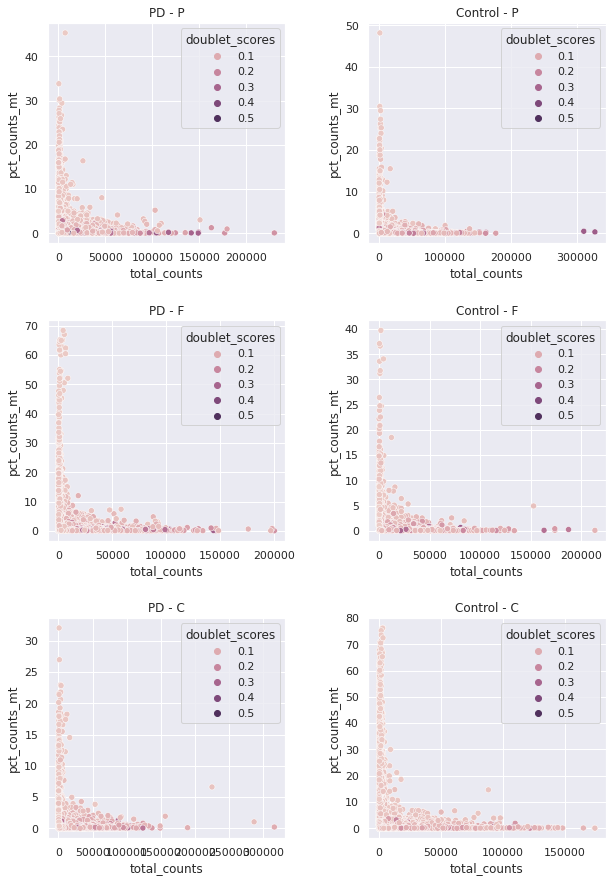

In [19]:
scatter(adata, var1='total_counts', var2='pct_counts_mt', hue = 'doublet_scores')

## UMAP visualisation

I am generating a UMAP to visualise how the architecture of cell types relates to the metrics for filtration. Normally in UMAPs following pre-processing the nuclei with lower quality will be in the center of the UMAP (less clear identity), however this is less evident prior to pre-processing. 

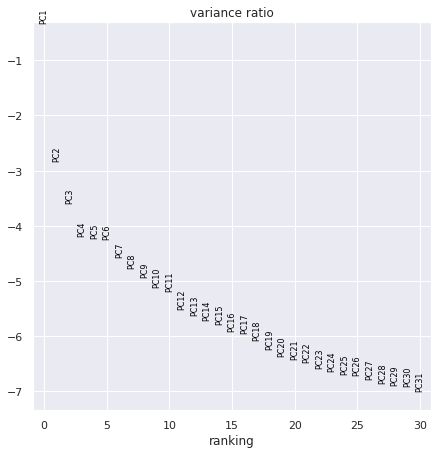

In [20]:
sns.set(rc={'figure.figsize':(7,7)})

sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata, log=True)
sc.pp.neighbors(adata, n_neighbors=45, n_pcs=50)
sc.tl.umap(adata)

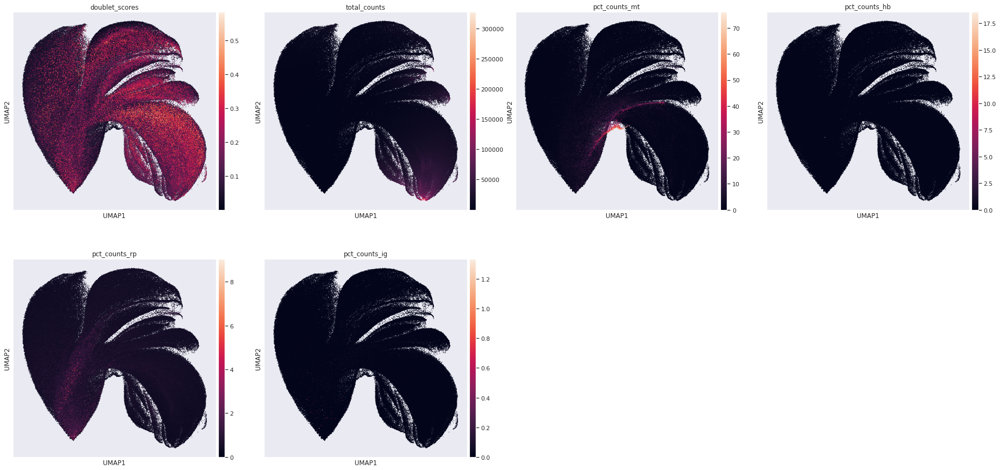

In [21]:
sns.set_theme(style="white", palette=None)
sns.set(rc={'figure.figsize':(7,7)})

sc.pl.umap(adata, color=['doublet_scores', 'total_counts', 'pct_counts_mt', 'pct_counts_hb', 'pct_counts_rp', 'pct_counts_ig'], s = 5)

In [22]:
adata.obs['sample_id'].value_counts().to_frame('Nuclei').merge(adata.obs.groupby('sample_id').median()[['doublet_scores',
       'n_genes_by_counts', 'total_counts', 'total_counts_hb', 'log1p_total_counts_hb',
       'pct_counts_hb','pct_counts_mt','pct_counts_rp','pct_counts_ig']], left_index = True, right_index = True, how = 'left').to_csv('summary_samples.csv')


## 1.6 Threshold selection for filtration

For this I have tested three methods: 
 - (1) Manual selection of thresholds 
 - (2) Using the median absolute deviation (MAD)*5
 - (3) Using the median absolute deviation (MAD)*5 AND excluding only nuclei that both have high total counts **and** have high mitochondrial content (recommended by Theis lab 'single cell best practices' handbook)
   
(1)
This was a more lenient method, it was conventional in the field until recently. Also the method used in the Hardy data. 

(2)
Given that there were some effects of batches, this method may make sense especially when there is inter batch variability. It results in the exclusion of more nuclei. 

(3) 
This was a very lenient exclusion - about 100 nuclei total were excluded


**Verdict:** I am opting to use the more lenient manual threshold while keeping the annotations that are more stringent from (2). This will allow me to, at the step of clustering, identify whether these nuclei need to be excluded anyway - in which case I may use the MAD method in future. Importantly, it keeps the methods used here and in the Hardy data consistent to facilitate integration. 

In [23]:
# Method 1

# Mitochondrial, RP, HB <3%
adata.obs['is_doublet'] = adata.obs['doublet_scores']>0.15
print((adata.obs['doublet_scores']>0.15).sum())

39322


In [24]:
# Contaminants
print('Mitochondrial post exclusion:') 
print((adata.obs['pct_counts_mt']<5).sum())

print('ribosomal post exclusion:')
print((adata.obs['pct_counts_rp']<5).sum())

print('haemoglobin post exclusion:')
print((adata.obs['pct_counts_hb']<5).sum())

print('Total counts post exclusion:')
print((adata.obs['total_counts']<150000).sum())

Mitochondrial post exclusion:
509768
ribosomal post exclusion:
516584
haemoglobin post exclusion:
516611
Total counts post exclusion:
516581


In [25]:
print(((adata.obs['pct_counts_mt']>5) | (adata.obs['total_counts']>150000) | (adata.obs['pct_counts_rp']>3) | (adata.obs['pct_counts_hb']>3)).sum())

adata.obs['manual_outliers'] = ((adata.obs['pct_counts_mt']>5) | (adata.obs['total_counts']>150000) | (adata.obs['pct_counts_rp']>5) | (adata.obs['pct_counts_hb']>5))

7034


In [26]:
# Method 2
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * scipy.stats.median_abs_deviation(M)) | (
        np.median(M) + nmads * scipy.stats.median_abs_deviation(M) < M
    )
    return outlier

def outlier_per_batch(adata, batch_key, metric, nmads, var_name):
    for batch in adata.obs[batch_key].unique():
        L = adata[adata.obs[batch_key]==batch]
        L.obs[var_name] = is_outlier(L, metric, nmads)
        try:
            out = pd.concat([out, L.obs[var_name]])
        except NameError:
            out = None
            out = L.obs[var_name]    
            print(out)
    return out

# MT, RP, HB contamination
contaminated = (outlier_per_batch(adata, 'batch', 'pct_counts_mt', 3, 'mt_outlier') | outlier_per_batch(adata, 'batch', 'pct_counts_rp', 5, 'rp_outlier')
    | outlier_per_batch(adata, 'batch', 'pct_counts_hb', 5, 'hb_outlier')
    | (adata.obs["pct_counts_mt"] > 8)
)
print('Contaminated exclusion with MAD*5:')
print(contaminated.sum())

# High Total counts
counts_out = (
    outlier_per_batch(adata, 'batch', 'log1p_total_counts', 5, 'tc_outlier')
    | outlier_per_batch(adata, 'batch', 'log1p_n_genes_by_counts', 5, 'ngenes_outlier')
)
print('Counts exclusion with MAD*5:')
print(counts_out.sum())

/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)


index
AAACAGCCAAACAACA-55    False
AAACAGCCAAATATCC-20    False
AAACAGCCAAATGCCC-55     True
AAACAGCCAACTAGAA-54    False
AAACAGCCAAGGTAAC-55    False
                       ...  
TTTGTTGGTTGGCCGA-7     False
TTTGTTGGTTGGTTGA-41     True
TTTGTTGGTTGTAACG-20    False
TTTGTTGGTTTGGGTA-55    False
TTTGTTGGTTTGTGGA-41    False
Name: mt_outlier, Length: 57693, dtype: bool


/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlie

index
AAACAGCCAAACAACA-55    False
AAACAGCCAAATATCC-20    False
AAACAGCCAAATGCCC-55    False
AAACAGCCAACTAGAA-54    False
AAACAGCCAAGGTAAC-55    False
                       ...  
TTTGTTGGTTGGCCGA-7     False
TTTGTTGGTTGGTTGA-41    False
TTTGTTGGTTGTAACG-20    False
TTTGTTGGTTTGGGTA-55    False
TTTGTTGGTTTGTGGA-41    False
Name: rp_outlier, Length: 57693, dtype: bool


/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlie

index
AAACAGCCAAACAACA-55    False
AAACAGCCAAATATCC-20    False
AAACAGCCAAATGCCC-55    False
AAACAGCCAACTAGAA-54    False
AAACAGCCAAGGTAAC-55    False
                       ...  
TTTGTTGGTTGGCCGA-7     False
TTTGTTGGTTGGTTGA-41    False
TTTGTTGGTTGTAACG-20    False
TTTGTTGGTTTGGGTA-55    False
TTTGTTGGTTTGTGGA-41    False
Name: hb_outlier, Length: 57693, dtype: bool


/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlie

Contaminated exclusion with MAD*5:
106174


/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)


index
AAACAGCCAAACAACA-55    False
AAACAGCCAAATATCC-20    False
AAACAGCCAAATGCCC-55    False
AAACAGCCAACTAGAA-54    False
AAACAGCCAAGGTAAC-55    False
                       ...  
TTTGTTGGTTGGCCGA-7     False
TTTGTTGGTTGGTTGA-41    False
TTTGTTGGTTGTAACG-20    False
TTTGTTGGTTTGGGTA-55    False
TTTGTTGGTTTGTGGA-41    False
Name: tc_outlier, Length: 57693, dtype: bool


/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlie

index
AAACAGCCAAACAACA-55    False
AAACAGCCAAATATCC-20    False
AAACAGCCAAATGCCC-55    False
AAACAGCCAACTAGAA-54    False
AAACAGCCAAGGTAAC-55    False
                       ...  
TTTGTTGGTTGGCCGA-7     False
TTTGTTGGTTGGTTGA-41    False
TTTGTTGGTTGTAACG-20    False
TTTGTTGGTTTGGGTA-55    False
TTTGTTGGTTTGTGGA-41    False
Name: ngenes_outlier, Length: 57693, dtype: bool


/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlier(L, metric, nmads)
/tmp/slurm_58028107/ipykernel_243897/610693002.py:12: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  L.obs[var_name] = is_outlie

Counts exclusion with MAD*5:
267


In [27]:
# Method 3
((contaminated==True ) & (counts_out==True)).sum()

103

In [28]:
# Choose method 2

adata.obs.reset_index(inplace = True)
adata.obs = adata.obs.merge(contaminated.to_frame('contaminated_MAD5'), left_on = 'index', right_index = True, how = 'left')
adata.obs = adata.obs.merge(counts_out.to_frame('counts_MAD5'), left_on = 'index', right_index = True, how = 'left')
adata.obs.set_index('index', inplace = True)


### Visualise post-exclusion

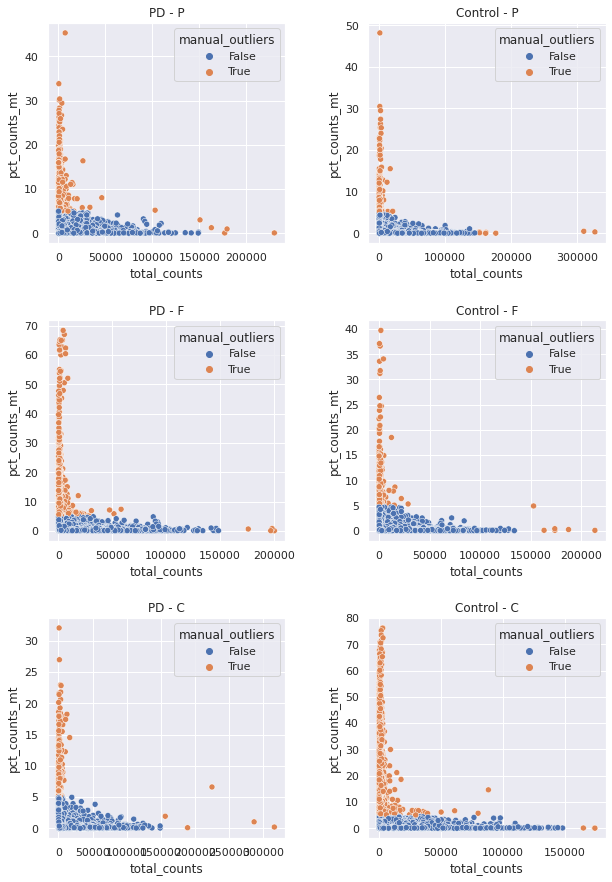

In [29]:
scatter(adata, var1='total_counts', var2='pct_counts_mt', hue = 'manual_outliers')

/camp/lab/gandhis/home/users/grantpm/.conda/envs/panpipes/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


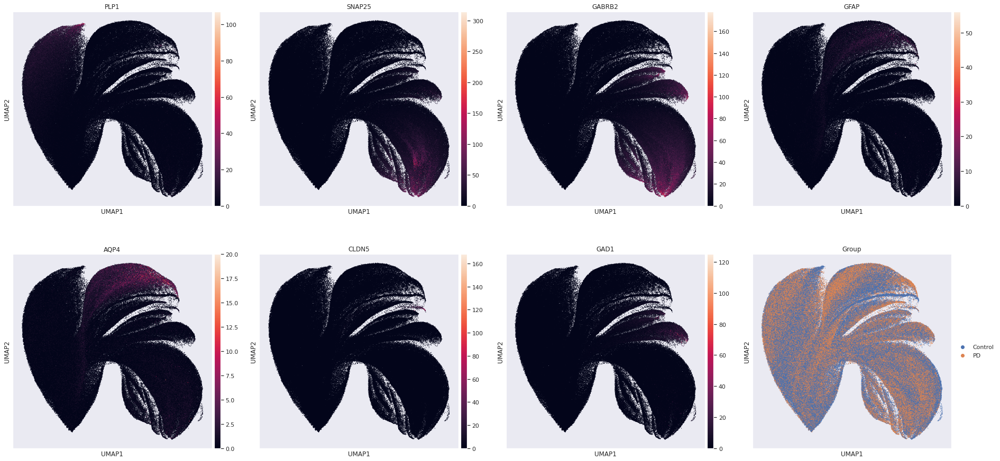

In [30]:
sns.set_theme(style="white", palette=None)
sns.set(rc={'figure.figsize':(7,7)})

sc.pl.umap(adata[(adata.obs['manual_outliers']==False) & (adata.obs['is_doublet']==False)], color=['PLP1', 'SNAP25', 'GABRB2', 'GFAP', 'AQP4', 'CLDN5', 'GAD1', 'Group'], s = 5)

/camp/lab/gandhis/home/users/grantpm/.conda/envs/panpipes/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


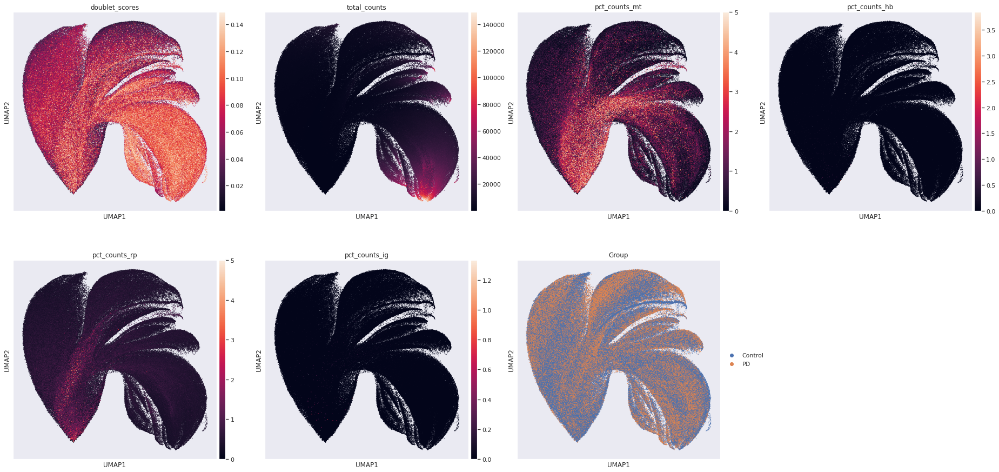

In [31]:
sc.pl.umap(adata[(adata.obs['manual_outliers']==False) & (adata.obs['is_doublet']==False)], color=['doublet_scores', 'total_counts', 'pct_counts_mt', 'pct_counts_hb', 'pct_counts_rp', 'pct_counts_ig', 'Group'], s = 5)

/camp/lab/gandhis/home/users/grantpm/.conda/envs/panpipes/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


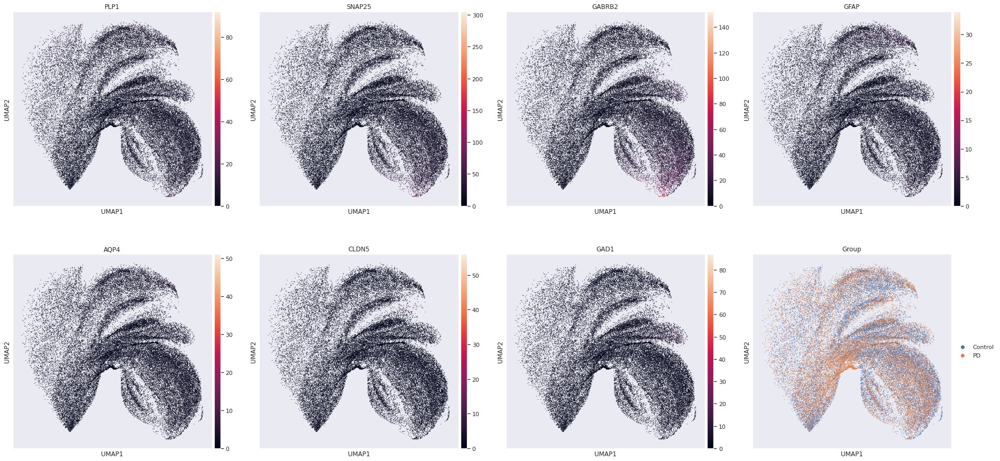

In [32]:
sc.pl.umap(adata[(adata.obs['manual_outliers']!=False) | (adata.obs['is_doublet']!=False)], color=['PLP1', 'SNAP25', 'GABRB2', 'GFAP', 'AQP4', 'CLDN5', 'GAD1', 'Group'], s = 5)

/camp/lab/gandhis/home/users/grantpm/.conda/envs/panpipes/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


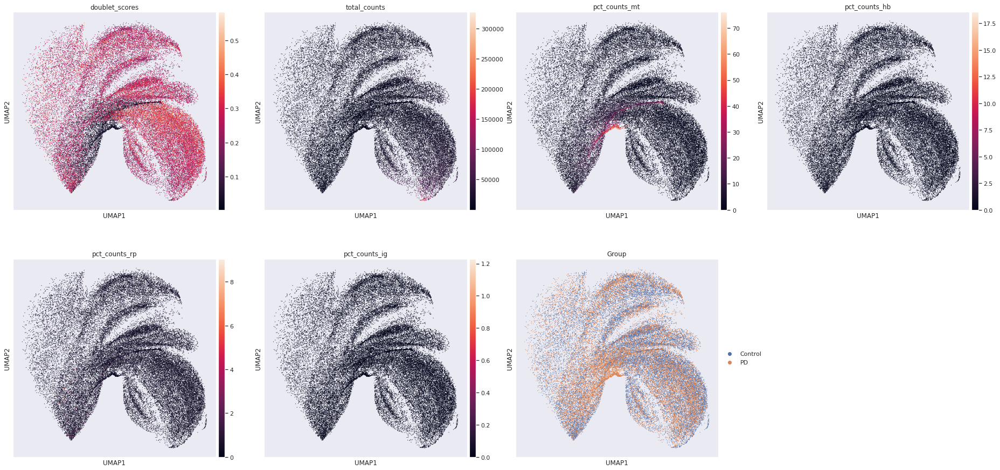

In [33]:
sc.pl.umap(adata[(adata.obs['manual_outliers']!=False) | (adata.obs['is_doublet']!=False)], color=['doublet_scores', 'total_counts', 'pct_counts_mt', 'pct_counts_hb', 'pct_counts_rp', 'pct_counts_ig', 'Group'], s = 5)

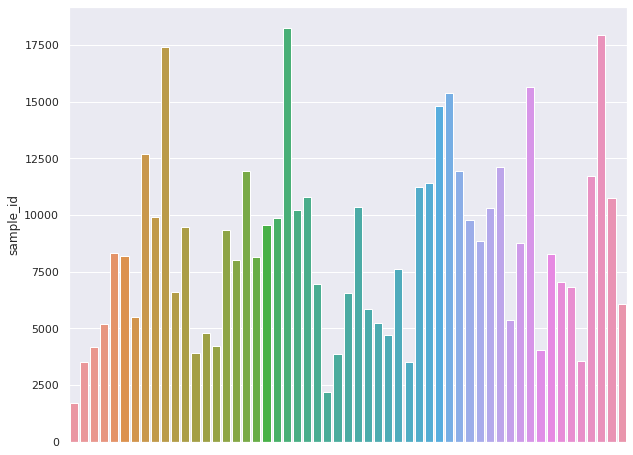

In [34]:
sns.set(rc={'figure.figsize':(10,8)})

g = sns.barplot(data=adata[(adata.obs['manual_outliers']==False) & (adata.obs['is_doublet']==False)].obs['sample_id'].value_counts().to_frame(), x=adata[(adata.obs['manual_outliers']!=False) | (adata.obs['is_doublet']!=False)].obs['sample_id'].value_counts().index, y='sample_id')
g.set(label=None)
g.set(xticklabels=[])
plt.show()

In [35]:
adata[(adata.obs['manual_outliers']==False) & (adata.obs['is_doublet']==False)]


View of AnnData object with n_obs × n_vars = 470444 × 61860
    obs: 'sample_id', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'log1p_total_counts_rp', 'pct_counts_rp', 'total_counts_ig', 'log1p_total_counts_ig', 'pct_counts_ig', 'MarkersNeutro_score', 'S_score', 'G2M_score', 'phase', 'new', 'Case', 'Age', 'Sex', 'Onset', 'Duration', 'Dementia', 'PMI', 'SH/X', 'FixFr', 'SC', 'CSF', 'Q.', 'Vol.', 'RIN', 'Weight', 'NPD', 'aSN', 'Tau', 'aB', 'Group', 'Fresh/Fix', 'Suitable', 'Pathology', 'region', 'batch', 'is_doublet', 'manual_outliers', 'contaminated_MAD5', 'counts_MAD5'
    var: 'gene_ids', 'feature_types', 'genome', 'interval', 'hb', 'mt', 'rp', 'ig', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts

### Final thoughts for RNA

The final dataset has 470,444 nuclei (a difference of around 40,000 from the starting data, <10% of nuclei). The exclusion has not excluded predominantly a particular cell type (as shown by the UMAP), and all samples are still represented in the final dataset. The majority of nuclei were excluded due to the doublet score cutoff. 

# 2.0 ATAC metrics
ATAC data includes both coding and non-coding regions, so genes cannot be used as pre-defined features for this type of data. Instead we select peaks in the distribution of fragment counts along the genome. 
Peaks in coding regions -> indicate that a gene might be trascribed
Peaks in non-coding regions -> pre-requisite for the binding of regulatory proteins (e.g. transcription factors). 

Importantly, ATAC data tends to be highly sparse, since the maximum number of counts for a given base pair position is 2. 


In [164]:
madata['atac'].obs.reset_index(inplace = True)
madata['atac'].obs = madata['atac'].obs.merge(batches, left_on = 'sample_id', right_on = 'sample_id', how = 'left')
madata['atac'].obs.set_index('index', inplace = True)

summary = madata['atac'].obs['sample_id'].value_counts().to_frame().rename(columns = {'sample_id' : 'counts'})
summary = summary.merge(batches, left_index = True, right_on='sample_id', how = 'left').set_index('sample_id')
summary = madata['atac'].obs.groupby(['sample_id', 'batch', 'Group']).median().reset_index()
summary

/camp/lab/gandhis/home/users/grantpm/.conda/envs/panpipes/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


,sample_id,batch,Group,is_cell,excluded_reason,gex_raw_reads,gex_mapped_reads,gex_conf_intergenic_reads,gex_conf_exonic_reads,gex_conf_intronic_reads,...,atac_fragments,atac_TSS_fragments,atac_peak_region_fragments,atac_peak_region_cutsites,n_genes_by_counts,total_counts,nucleosome_signal,tss_score,pct_fragments_in_peaks,atac_qc_pass
0,C030C,1,Control,1.0,0.0,14924.0,14115.0,842.0,3375.0,7865.0,...,9602.0,3607.0,4184.0,7769.0,1451.0,2778.0,1.0,2.184132,38.502234,1.0
1,C030C,1,PD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,C030C,12,Control,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,C030C,12,PD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,C030C,13,Control,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1425,PDC087F,7,PD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1426,PDC087F,8,Control,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1427,PDC087F,8,PD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1428,PDC087F,9,Control,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


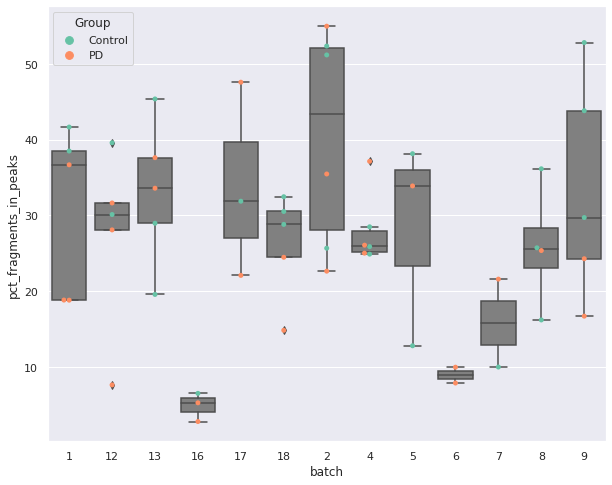

In [165]:
g = sns.boxplot(data=summary, x='batch', y='pct_fragments_in_peaks', color = 'grey')
g = sns.swarmplot(data=summary, x='batch', y='pct_fragments_in_peaks', hue = 'Group', palette = 'Set2')
g.set(label=None)
plt.show()

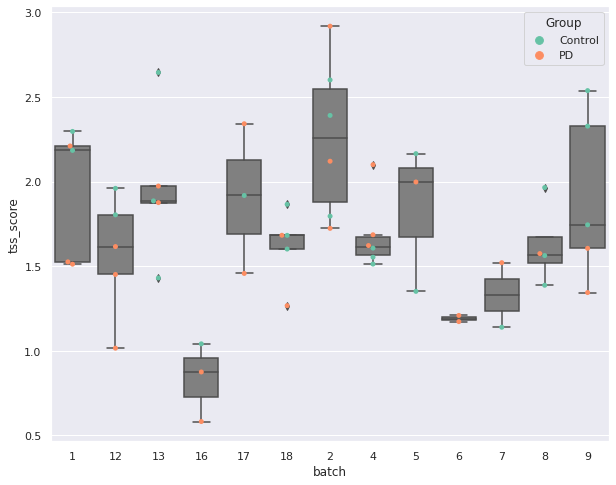

In [166]:
g = sns.boxplot(data=summary, x='batch', y='tss_score', color = 'grey')
g = sns.swarmplot(data=summary, x='batch', y='tss_score', hue = 'Group', palette = 'Set2')
g.set(label=None)
plt.show()

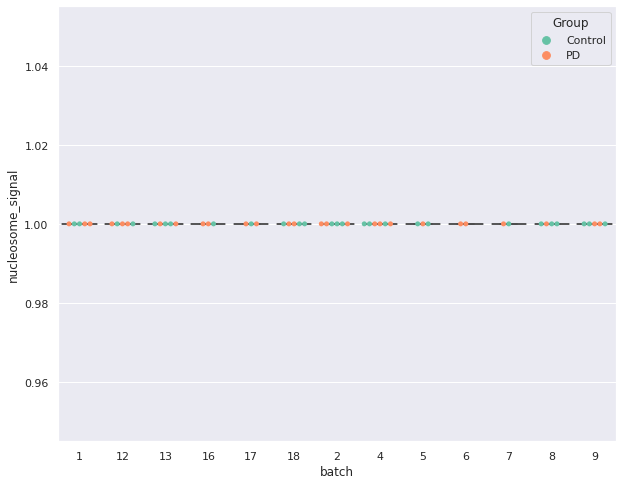

In [167]:
g = sns.boxplot(data=summary, x='batch', y='nucleosome_signal', color = 'grey')
g = sns.swarmplot(data=summary, x='batch', y='nucleosome_signal', hue = 'Group', palette = 'Set2')
g.set(label=None)
plt.show()

In [44]:
madata['atac'].obs.rename(columns = {'sample_id_y': 'sample_id'}, inplace = True)

In [54]:
d = {'sample_id': ['exp_type', 'sample_id']}
madata['atac'].obs.rename(columns=lambda c: d[c].pop(0) if c in d.keys() else c, inplace = True)


AAACAGCCAAACAACA-55    PD0086P
AAACAGCCAAACATAG-42    PD0980F
AAACAGCCAAACCTAT-13    PD0945P
AAACAGCCAAACCTTG-34      C073P
AAACAGCCAAACCTTG-38    PDC034C
                        ...   
TTTGTTGGTTTGGGCG-34      C073P
TTTGTTGGTTTGGGTA-55    PD0086P
TTTGTTGGTTTGTCTA-22    PD0913P
TTTGTTGGTTTGTGGA-41    PDC035F
TTTGTTGGTTTGTGGA-46    PD0612P
Name: sample_id, Length: 516612, dtype: category
Categories (55, object): ['C030C', 'C030F', 'C043C', 'C046C', ..., 'PDC085C', 'PDC085F', 'PDC085P', 'PDC087F']

### 2.1 Percent of fragments in peaks
Fraction of fragments in peak regions versus fragments outside of peaks (indicator of signal-to-noise ratio)

###-------------------------------------------------------------------------- pct_fragments_in_peaks --------------------------------------------------------------------------###


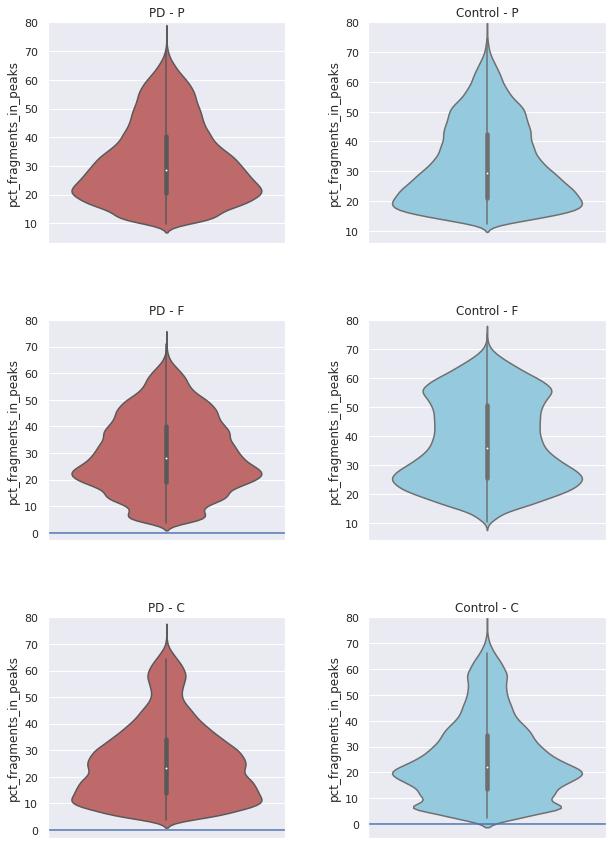

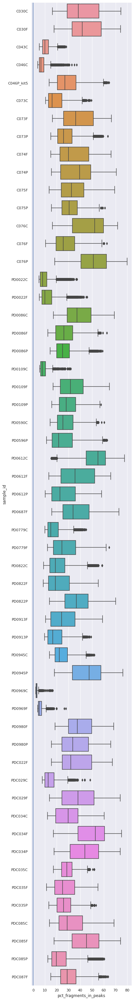

In [68]:
sns.set(font_scale=1)

violin_region_x_groups(adata = madata['atac'],xparam0 = 'pct_fragments_in_peaks', thr0 = 0, lim = 80)

boxplot_plotting(madata['atac'], 'pct_fragments_in_peaks', 0)

### 2.2 TSS fragments

Transcription start sites (TSS) subset of fragments centered at the TSS vs those in TSS-flanking regions (signal-to-noise ratio metric)

###-------------------------------------------------------------------------- atac_TSS_fragments --------------------------------------------------------------------------###


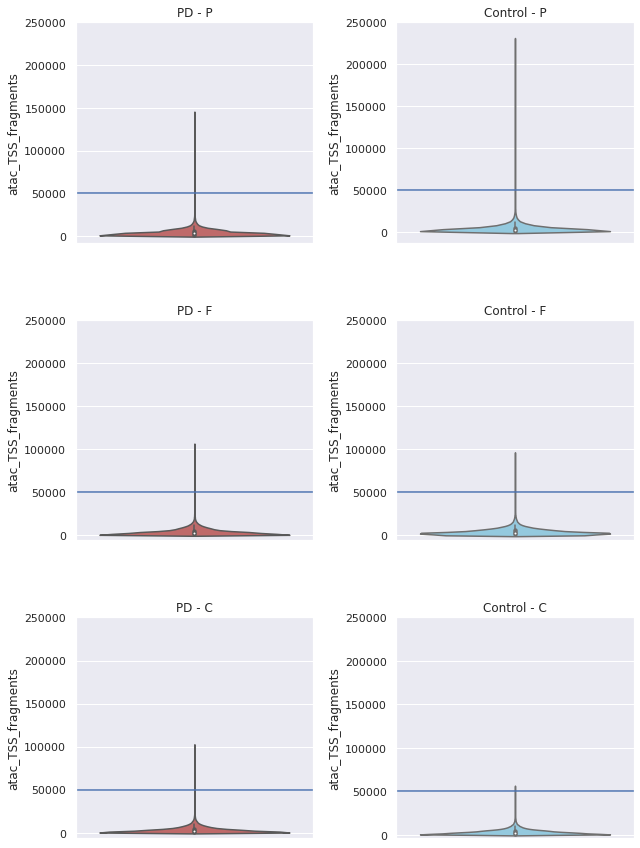

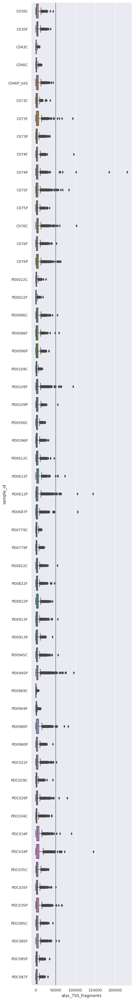

In [69]:
violin_region_x_groups(adata = madata['atac'],xparam0 = 'atac_TSS_fragments', thr0 = 50000, lim = 250000)
boxplot_plotting(madata['atac'], 'atac_TSS_fragments', 50000)

### 2.3 Nucleosome signal

The nucleosome signal refers to the ratio of mono-nucleosomal to nucleosome-free fragments and can also be interpreted as a signal-to-noise ratio in each cell

###-------------------------------------------------------------------------- nucleosome_signal --------------------------------------------------------------------------###


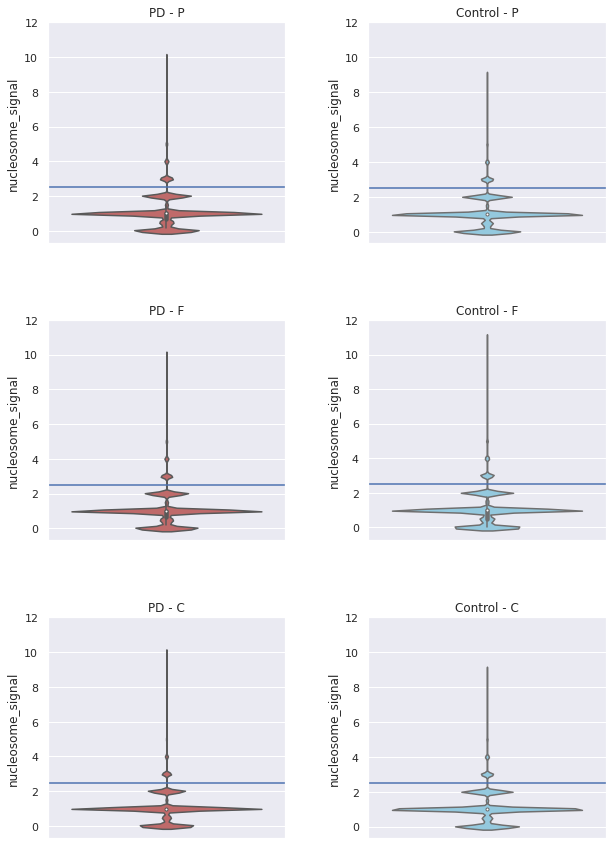

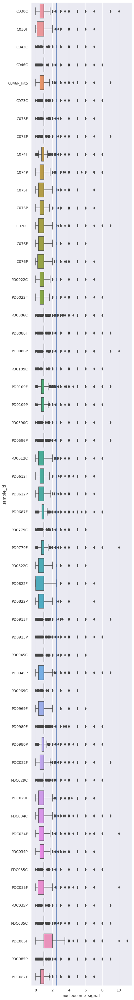

In [147]:
violin_region_x_groups(adata = madata['atac'],xparam0 = 'nucleosome_signal', thr0 = 2.5, lim = 12)
boxplot_plotting(madata['atac'], 'nucleosome_signal', 2.5)

### 2.4 Total fragments counts

Equivalent to the total counts in scRNAseq, it indicates the sequencing depth of the ATAC experiment

###-------------------------------------------------------------------------- atac_fragments --------------------------------------------------------------------------###


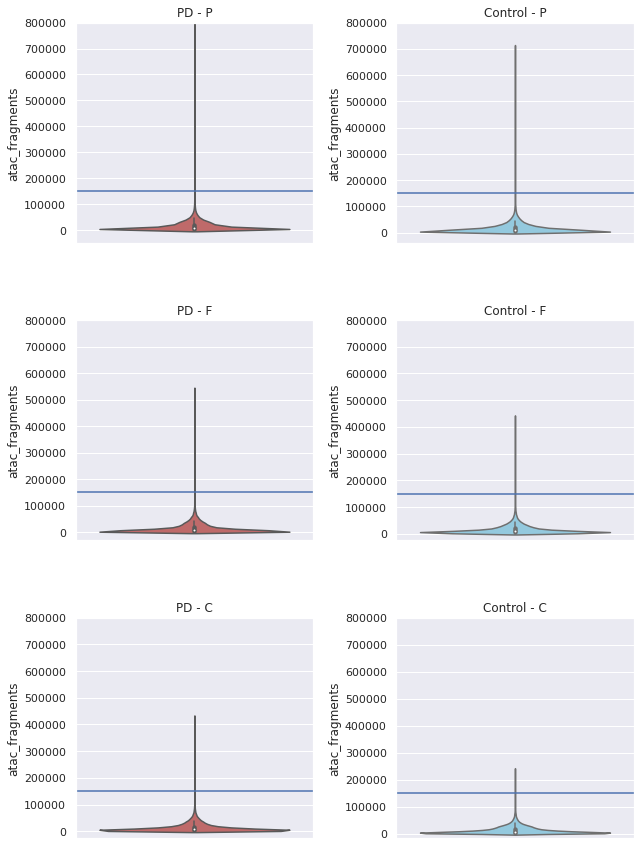

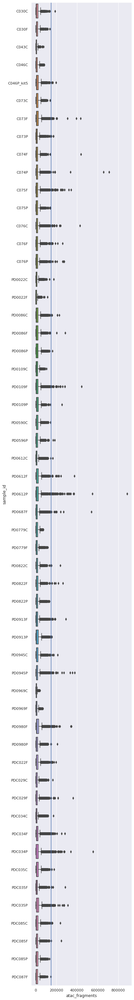

In [66]:
violin_region_x_groups(adata = madata['atac'],xparam0 = 'atac_fragments', thr0 = 150000, lim = 800000)
boxplot_plotting(madata['atac'], 'atac_fragments', 150000)

### 2.6 Threshold selection

Being slightly behind as a technology to snRNAseq, ATAC seq uses manual selection at present. ntegration.

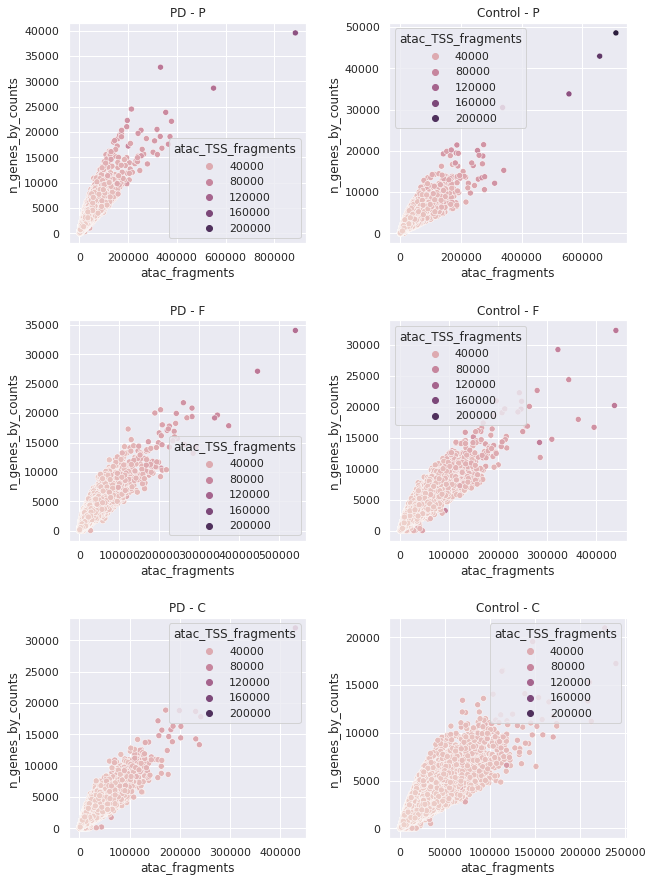

In [72]:
scatter(madata['atac'], var1='atac_fragments', var2='n_genes_by_counts', hue = 'atac_TSS_fragments')

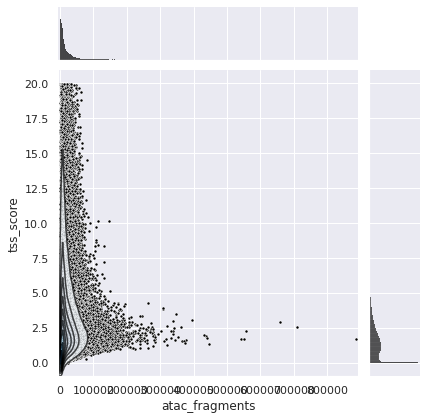

In [114]:
# upper TSS score boundary for plotting
plot_tss_max = 20

# Suggested thresholds (before log transform)
count_cutoff_lower = 1500
lcount_cutoff_upper = 100000
tss_cutoff_lower = 1.5


# Scatter plot & histograms
g = sns.jointplot(
    data=madata['atac'][(madata['atac'].obs["tss_score"] < plot_tss_max)].obs,
    x="atac_fragments",
    y="tss_score",
    color="black",
    marker=".",
)
# Density plot including lines
g.plot_joint(sns.kdeplot, fill=True, cmap="Blues", zorder=1, alpha=0.75)
g.plot_joint(sns.kdeplot, color="black", zorder=2, alpha=0.75)

plt.show()

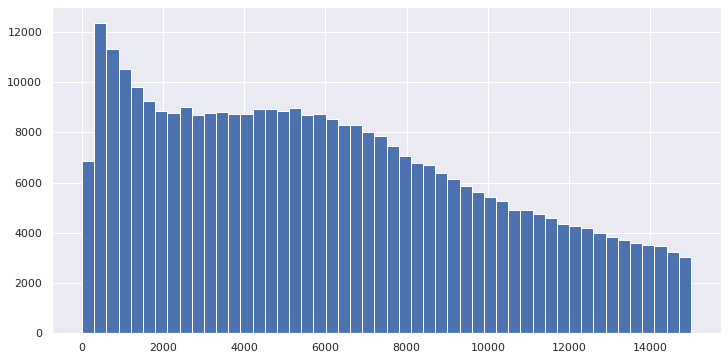

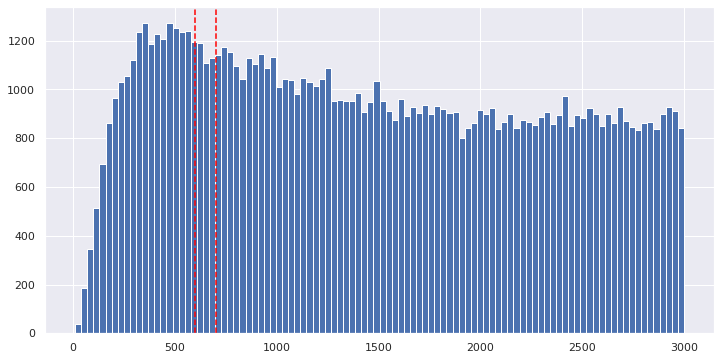

In [105]:
sns.set(rc={'figure.figsize':(12,6)})
madata['atac'][madata['atac'].obs['atac_fragments']<15000].obs['atac_fragments'].hist(bins = 50)
plt.show()
g = madata['atac'][madata['atac'].obs['atac_fragments']<3000].obs['atac_fragments'].hist(bins = 100)
g.axvline(x=600, c="red", linestyle="--")
g.axvline(x=700, c="red", linestyle="--")

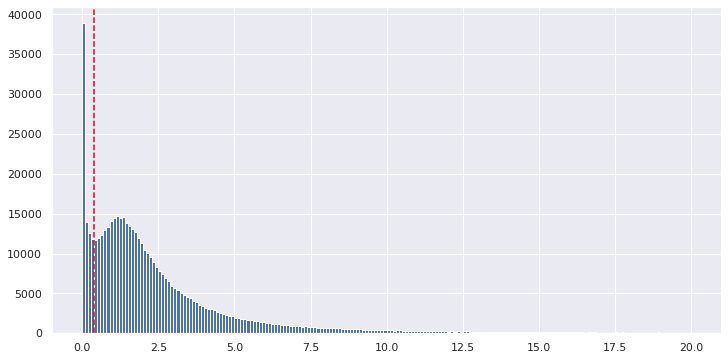

In [142]:
g = madata['atac'][madata['atac'].obs['tss_score']<20].obs['tss_score'].hist(bins = 200)
g.axvline(x=0.4, c="red", linestyle="--")

### Chosen ATAC thresholds

Total number of fragment counts per cell: > 600 and < 150000

TSS score: > 0.4 and < 50

Nucleosome signal: < 2.5

In [149]:
madata['atac'].obs['atac_qc_pass'] = ((madata['atac'].obs['tss_score']>0.4) & (madata['atac'].obs['tss_score']<50) & (madata['atac'].obs['nucleosome_signal']<2.5) & (madata['atac'].obs['atac_fragments']>600) & (madata['atac'].obs['atac_fragments']<150000))

In [168]:
madata['atac'].obs['atac_qc_pass'].sum()

406357

### Final thoughts QC for ATAC

With these filtration thresholds, of the 516,000 nuclei, we are left with 406,357 nuclei in total (80% of starting numbers). The batches with evidence of lower quality in ATAC were also the batches with evidence of lower RNA quality. Due to the discrepancy in the number of nuclei kept for both methods, we have to choose between keeping nuclei that satisfy all criteria for both ATAC and RNA or to perform following steps separately for RNA and ATAC and only for specific analyses where having all the information is useful to then take the matching data. Given that the intersection of nuclei that pass the RNA and ATAC thresholds is only 71% of all nuclei (n = 369,821), I recommend this option to maximise data utility. 

In [172]:
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3
 
# Driver Code
print(len(intersection(adata[(adata.obs['manual_outliers']==False) & (adata.obs['is_doublet']==False)].obs.index, madata['atac'][madata['atac'].obs['atac_qc_pass']==True].obs.index)))

369821
